### change this to True if using colab

In [ ]:
using_colab = False

### The below cell sets up a Colab environment for working with PyTorch, Torchvision, and the SAM2 model. It installs necessary libraries, downloads a sample dataset, and retrieves a pretrained model checkpoint

In [ ]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

### Set-up

In [ ]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
#os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [ ]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

/scratch/jp6988/sam2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


### These methods are utility functions for visualizing segmentation results. The show_mask function overlays a colored transparency on a given mask, optionally using random colors or a colormap. show_points displays positive and negative points on a plot with distinct colors and markers, while show_box draws a bounding box around specified coordinates on a plot. Together, these functions aid in visual analysis of segmentation outputs.

In [ ]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like <frame_index>.jpg.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:

ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
where -q:v generates high-quality JPEG frames and -start_number 0 asks ffmpeg to start the JPEG file from 00000.jpg.

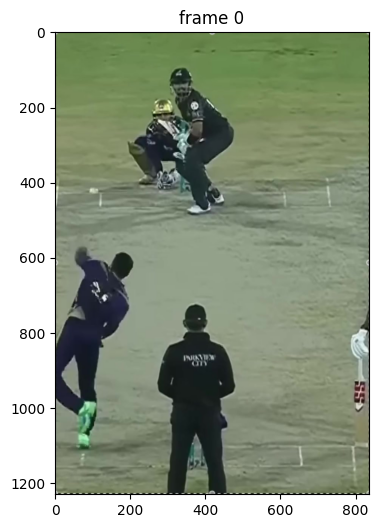

In [ ]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./video_frames_metrics"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

### Detecting the Ball - using template matching

This code performs multi-scale template matching to detect an object (e.g., a white ball) in the left portion of a grayscale image, adjusting for different template sizes. It identifies the best match, calculates its center, and highlights the detected location with circles for further analysis.



Center of the detected ball in left half: (102, 421)


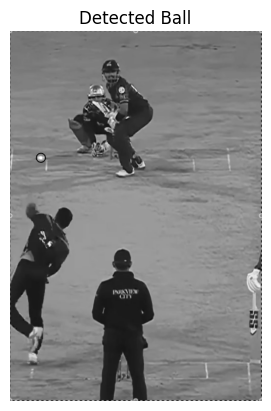

In [ ]:
import cv2

# Load image and template
template_path = "whiteball.png"
image = cv2.imread(os.path.join(video_dir, frame_names[frame_idx]), cv2.IMREAD_GRAYSCALE)
template = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)

height, width = image.shape
left_third = image[:, :width // 3]

scales = [0.5, 0.75, 1.0, 1.25, 1.5]  # Adjust scales as needed
best_match = None
best_value = -1
best_location = None
best_template_size = None

# Multi-scale template matching
for scale in scales:
    resized_template = cv2.resize(template, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    result = cv2.matchTemplate(left_third, resized_template, cv2.TM_CCOEFF_NORMED)
    _, max_val, _, max_loc = cv2.minMaxLoc(result)

    if max_val > best_value:
        best_value = max_val
        best_match = resized_template
        best_location = max_loc
        best_template_size = resized_template.shape[::-1]

# Calculate center of best match
template_width, template_height = best_template_size
center_x = best_location[0] + template_width // 2
center_y = best_location[1] + template_height // 2
center = (center_x, center_y)

# Adjust center to original image coordinates
center_adjusted = (center_x, center_y)


print("Center of the detected ball in left half:", center_adjusted)



cv2.circle(image, center_adjusted, 5, (255, 0, 0), -1)
cv2.circle(image, center_adjusted, 15, (0, 255, 0), 2)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image in JupyterLab
plt.imshow(image_rgb)
plt.title("Detected Ball")
plt.axis('off')
plt.show()

### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an inference state on this video.

During initialization, it loads all the JPEG frames in video_path and stores their pixels in inference_state (as shown in the progress bar below).

In [ ]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 183/183 [00:07<00:00, 24.88it/s]


### Reset previous state
Note: if you have run any previous tracking using this inference_state, please reset it first via reset_state.

(The cell below is just for illustration; it's not needed to call reset_state here as this inference_state is just freshly initialized above.)

In [ ]:
predictor.reset_state(inference_state)

### This code annotates a frame by adding a new point with a specified object ID to an inference model, updating its state with the new annotation. It visualizes the frame, annotated point, and the resulting segmentation mask for interactive analysis.

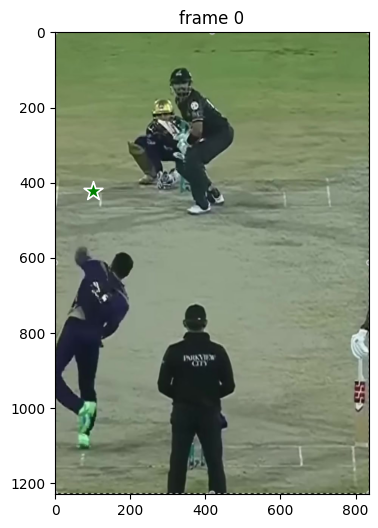

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

points = np.array([[center_x, center_y]], dtype=np.float32)

labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)


plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

propagate in video: 100%|██████████| 183/183 [01:05<00:00,  2.77it/s]


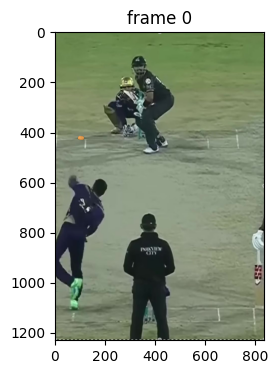

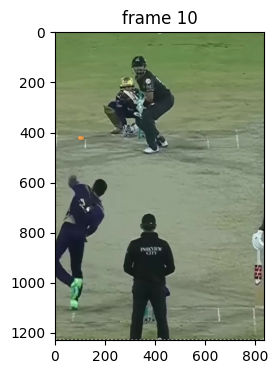

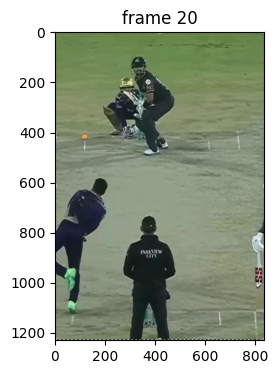

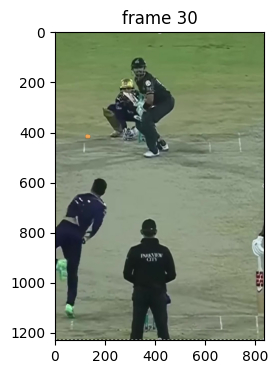

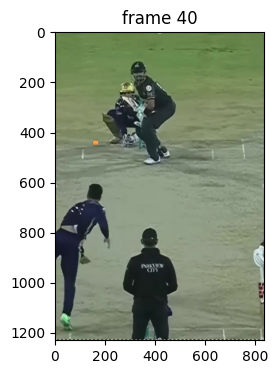

...

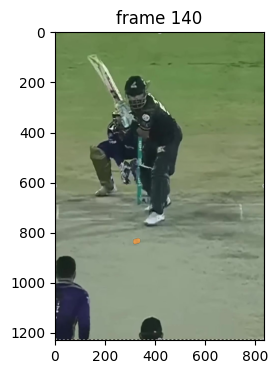

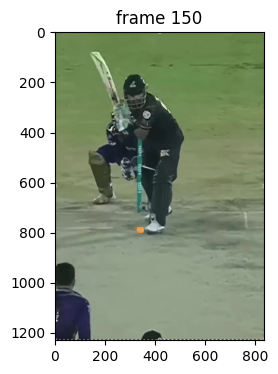

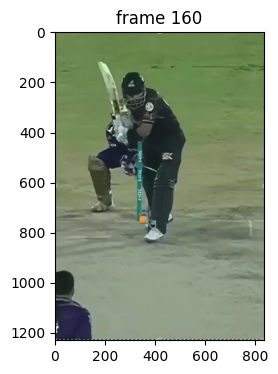

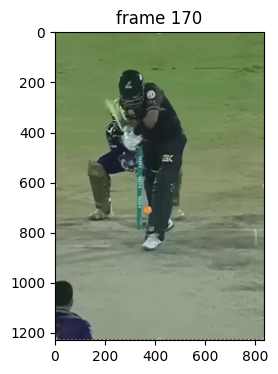

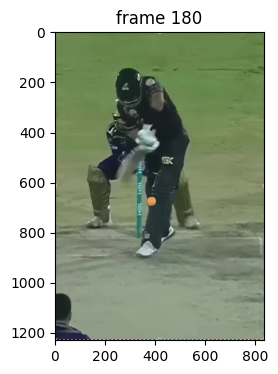

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

## Creating a video

In [ ]:
import cv2
import numpy as np
from PIL import Image
import os

# Define output video parameters
output_video_path = "segmented_video_with_path_lbw2.mp4"
frame_width, frame_height = Image.open(os.path.join(video_dir, frame_names[0])).size
fps = 10  # Adjust based on the frame rate of your input video

# Initialize video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Store ball positions for tracing
ball_positions = []

# Iterate through all frames and write the segmented frames to the video
for out_frame_idx in range(len(frame_names)):
    # Open the frame as a background
    frame = Image.open(os.path.join(video_dir, frame_names[out_frame_idx]))
    frame = np.array(frame)  # Convert to NumPy array

    # Debug: Check the shape of the frame
    if len(frame.shape) < 2:
        raise ValueError(f"Frame {out_frame_idx} has an invalid shape: {frame.shape}")

    # Create an overlay for the segmentation
    overlay = np.zeros_like(frame, dtype=np.uint8)

    # Apply the segmentation masks
    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            # Remove any extra dimensions in the mask
            out_mask = np.squeeze(out_mask)  # Remove singleton dimensions (e.g., from (1, 574, 628) to (574, 628))

            # Debug: Check the shape of the mask
            if out_mask.ndim != 2:
                raise ValueError(f"Mask for frame {out_frame_idx}, object {out_obj_id} has an invalid shape after squeeze: {out_mask.shape}")

            # Ensure the mask matches the overlay/frame dimensions
            mask = (out_mask > 0).astype(np.uint8)  # Convert to binary mask
            if mask.shape[:2] != frame.shape[:2]:
                # Debug: Print shapes before resizing
                print(f"Resizing mask from {mask.shape[:2]} to {frame.shape[:2]}")
                mask = cv2.resize(mask, (frame.shape[1], frame.shape[0]), interpolation=cv2.INTER_NEAREST)

            # Get the centroid of the mask
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                largest_contour = max(contours, key=cv2.contourArea)
                M = cv2.moments(largest_contour)
                if M["m00"] != 0:  # Avoid division by zero
                    center_x = int(M["m10"] / M["m00"])
                    center_y = int(M["m01"] / M["m00"])
                    ball_positions.append((center_x, center_y))

            # Apply a random color to the overlay
            color = np.random.randint(0, 255, (3,), dtype=np.uint8)  # Random color
            for c in range(3):  # Apply color to each channel
                overlay[:, :, c] = np.where(mask > 0, color[c], overlay[:, :, c])

    # Combine the overlay with the original frame
    combined_frame = cv2.addWeighted(frame, 0.7, overlay, 0.3, 0)

    # Draw the path of the ball
    for i in range(1, len(ball_positions)):
        cv2.line(
            combined_frame,
            ball_positions[i - 1],
            ball_positions[i],
            (0, 255, 0),  # Green path
            thickness=2,
        )

    # Convert RGB to BGR for OpenCV
    combined_frame_bgr = cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR)

    # Write the frame to the video
    video_writer.write(combined_frame_bgr)

# Release the video writer
video_writer.release()

print(f"Segmented video with ball path saved at {output_video_path}")


Segmented video with ball path saved at segmented_video_with_path_lbw2.mp4


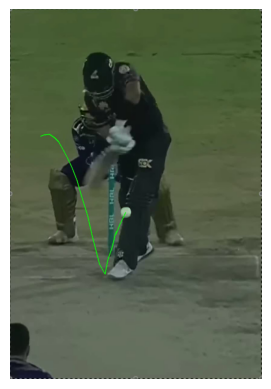

In [ ]:
import cv2
from IPython.display import clear_output
import time
import matplotlib.pyplot as plt

video_path = "segmented_video_with_path_lbw2.mp4"
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Cannot open video file.")
else:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert BGR to RGB for displaying in Jupyter
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show()

        # Add a delay to simulate the frame rate (adjust for your video's fps)
        time.sleep(1 / 30)

        clear_output(wait=True)

# Release the video capture object
cap.release()

### This cell overlays the trajectory of a ball onto a resized pitch image by drawing lines connecting consecutive ball positions, creating a visual representation of its movement.

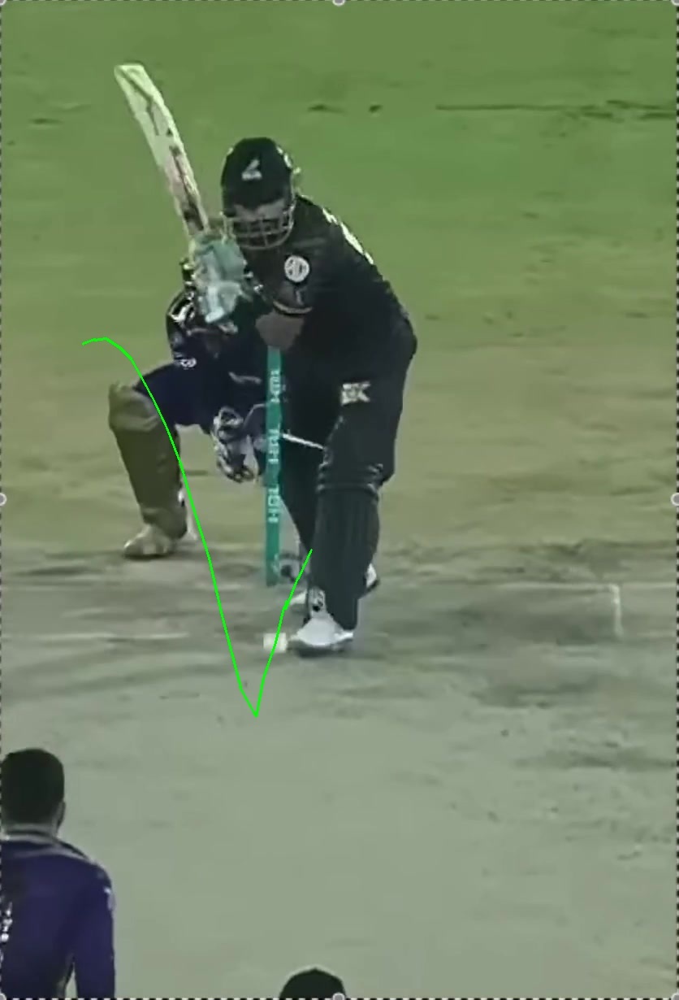

In [ ]:
import cv2
import numpy as np
from PIL import Image

# Path to the empty pitch image
empty_pitch_path = "./video_frames_metrics/00159.jpg"

# Load the empty pitch image
empty_pitch = cv2.imread(empty_pitch_path)
if empty_pitch is None:
    raise FileNotFoundError(f"Could not load the empty pitch image at {empty_pitch_path}")

# Resize the empty pitch image to match the video frame dimensions
empty_pitch_resized = cv2.resize(empty_pitch, (frame_width, frame_height))

# Draw the ball trace on the empty pitch
for i in range(1, len(ball_positions)):
    cv2.line(
        empty_pitch_resized,
        ball_positions[i - 1],
        ball_positions[i],
        (0, 255, 0),  # Green color for the trace
        thickness=2,
    )

# Save the new image with the trace
output_image_path = "trace3.jpg"
cv2.imwrite(output_image_path, empty_pitch_resized)

# Display the result in the notebook
from IPython.display import Image as IPImage, display
display(IPImage(output_image_path))


### Ball Speed Calculation

This cell calculates the speed of a ball over a cricket pitch in kilometers per hour by dividing the pitch length by the time taken, derived from the number of tracked frames and frame rate.



In [ ]:
import numpy as np

# Known parameters
pitch_length_meters = 22 * 0.9144  # Convert 22 yards to meters
frame_rate = 240  # Frames per second (adjust to your video's FPS)

# Ensure ball_positions has sufficient data
if len(ball_positions) < 2:
    raise ValueError("Not enough ball positions tracked to calculate speed.")

# Total time based on the number of frames
total_time_seconds = len(ball_positions) / frame_rate

# Calculate speed in m/s
speed_mps = pitch_length_meters / total_time_seconds

# Convert speed to km/h
speed_kmh = speed_mps * 3.6

# Print the result
print(f"Calculated Speed: {speed_kmh:.2f} km/h")

Calculated Speed: 94.98 km/h


### This code adds a translucent red rectangle over a defined region (stumps) on a ball trace image by blending an overlay with the original image

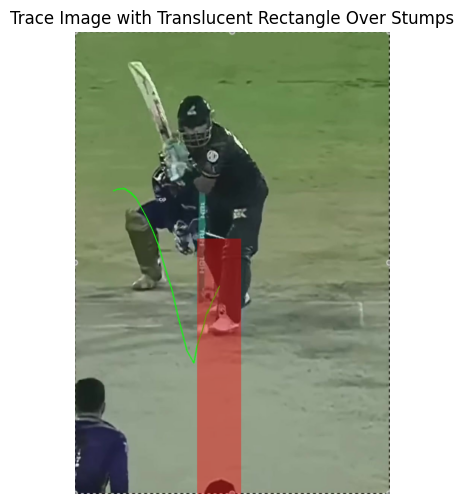

Trace image with translucent stump rectangle saved to trace_with_translucent_rectangle.jpg


In [ ]:
# Load the trace image
trace_image_path = "trace3.jpg"
trace_image = cv2.imread(trace_image_path)

if trace_image is None:
    raise FileNotFoundError("The trace image could not be loaded. Please provide the correct path.")

stump_rectangle = ((324, 550), (440, 1250))

# Create an overlay for the rectangle
overlay = trace_image.copy()
cv2.rectangle(overlay, stump_rectangle[0], stump_rectangle[1], (0, 0, 255), -1)

# Blend the overlay with the original image to make it translucent
alpha = 0.4  # Transparency factor
stump_overlay_trace = cv2.addWeighted(overlay, alpha, trace_image, 1 - alpha, 0)

# Convert to RGB for Matplotlib
stump_overlay_trace_rgb = cv2.cvtColor(stump_overlay_trace, cv2.COLOR_BGR2RGB)

# Display the trace image with the translucent rectangle
plt.figure(figsize=(10, 6))
plt.imshow(stump_overlay_trace_rgb)
plt.title("Trace Image with Translucent Rectangle Over Stumps")
plt.axis('off')
plt.show()

# Save the updated trace image with the translucent rectangle
output_path_trace = "trace_with_translucent_rectangle.jpg"
cv2.imwrite(output_path_trace, stump_overlay_trace)
print(f"Trace image with translucent stump rectangle saved to {output_path_trace}")


### Trace with decision

Last ball position: (383, 676)
Decision: OUT


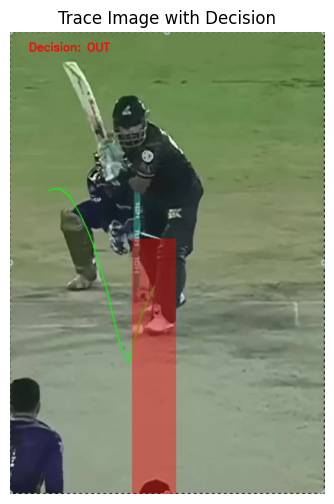

Trace image with decision saved to trace_with_decision.jpg


In [ ]:
if len(ball_positions) == 0:
    raise ValueError("No ball positions tracked. Ensure `ball_positions` is populated.")

# Get the last known position of the ball
last_ball_position = ball_positions[-1]  # (x, y)

# Define the rectangle boundaries
x1, y1 = stump_rectangle[0]
x2, y2 = stump_rectangle[1]

if x1 <= last_ball_position[0] <= x2 and y1 <= last_ball_position[1] <= y2:
    decision = "OUT"
else:
    decision = "NOT OUT"

print(f"Last ball position: {last_ball_position}")
print(f"Decision: {decision}")

# Overlay the decision on the image
output_image = stump_overlay_trace.copy()
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 255, 0) if decision == "NOT OUT" else (0, 0, 255)  # Green for NOT OUT, Red for OUT
thickness = 2

cv2.putText(
    output_image,
    f"Decision: {decision}",
    (50, 50),  # Position of text
    font,
    font_scale,
    color,
    thickness,
    cv2.LINE_AA,
)

# Convert to RGB for Matplotlib
output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

# Display the image with the decision
plt.figure(figsize=(10, 6))
plt.imshow(output_image_rgb)
plt.title("Trace Image with Decision")
plt.axis('off')
plt.show()

# Save the updated image with the decision
output_path_decision = "trace_with_decision.jpg"
cv2.imwrite(output_path_decision, output_image)
print(f"Trace image with decision saved to {output_path_decision}")


## Metrics

### Creating bounding boxes for the purpose of computing evaluation metrics

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# Rendering loop for visualization (every 15th frame)
plt.close("all")
available_frame_indices = list(video_segments.keys())

propagate in video: 100%|██████████| 183/183 [01:05<00:00,  2.78it/s]


### Visualizing the bounding boxes

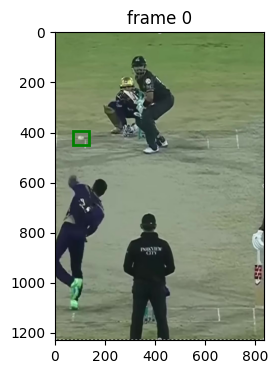

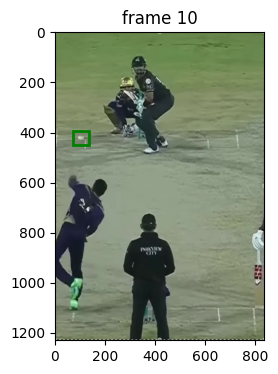

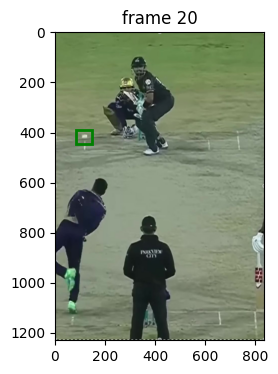

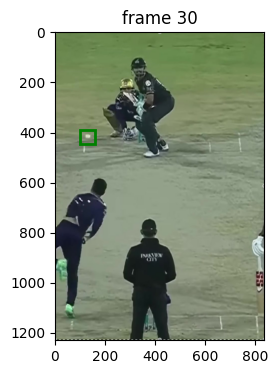

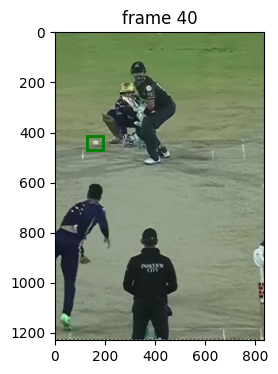

...

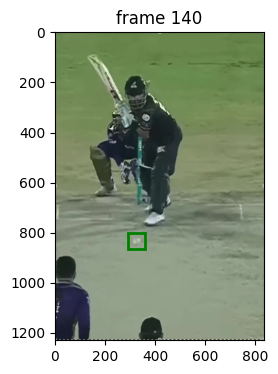

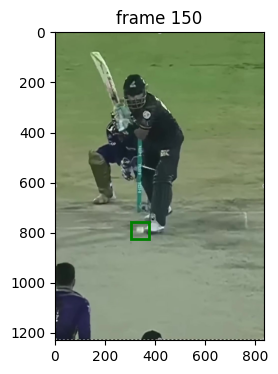

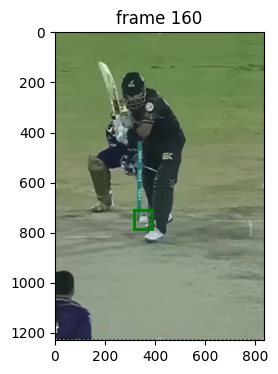

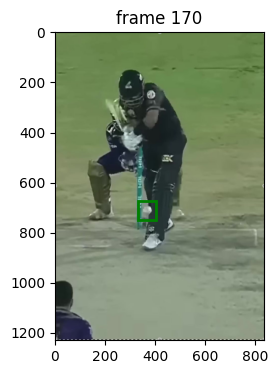

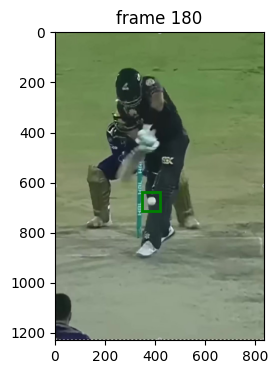

Output video saved to output_with_box.mp4


In [ ]:
start_frame = 0
end_frame = len(frame_names) - 1
vis_frame_stride = 10

margin = 20  # Increase this value as needed

for out_frame_idx in range(0, min(end_frame + 1, len(frame_names))):
    # Check if this frame should be visualized (stride condition)
    if out_frame_idx % vis_frame_stride != 0:
        continue

    # Check if the frame index exists in `video_segments`
    if out_frame_idx not in available_frame_indices:
        continue

    # Load the current frame with PIL for visualization
    frame_path = os.path.join(video_dir, frame_names[out_frame_idx])
    pil_frame = Image.open(frame_path)
    width, height = pil_frame.size  # PIL gives (width, height)

    # Render the frame with segmentation
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(pil_frame)

    # For each object mask in the current frame
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        # Ensure the mask is 2D
        if out_mask.ndim > 2:
            out_mask = out_mask.squeeze()  # Remove extra dimensions

        # Calculate bounding box from the mask
        y_indices, x_indices = np.where(out_mask > 0)  # Get non-zero mask indices

        # Skip if the mask is empty
        if len(y_indices) == 0 or len(x_indices) == 0:
            continue

        x_min, x_max = x_indices.min(), x_indices.max()
        y_min, y_max = y_indices.min(), y_indices.max()

        # Apply margin and ensure coordinates stay within image bounds
        x_min = max(x_min - margin, 0)
        y_min = max(y_min - margin, 0)
        x_max = min(x_max + margin, width - 1)
        y_max = min(y_max + margin, height - 1)

        # Show bounding box on the visualization
        box = [x_min, y_min, x_max, y_max]
        show_box(box, plt.gca())

    plt.show()

# Saving output video for frames from start_frame to end_frame (e.g., 60 to 170 as per your code)
output_video_path = "output_with_box.mp4"

# Get the frame size (width and height) using the first frame
first_frame = cv2.imread(os.path.join(video_dir, frame_names[0]))
frame_height, frame_width, _ = first_frame.shape

# Define the codec and initialize the VideoWriter
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # 'mp4v' is codec for MP4
fps = 20  # Set FPS for output video
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Process and save frames from start_frame to end_frame
for out_frame_idx in range(start_frame, min(end_frame + 1, len(frame_names))):
    # Read the current frame with OpenCV
    frame_path = os.path.join(video_dir, frame_names[out_frame_idx])
    frame = cv2.imread(frame_path)
    # frame.shape -> (frame_height, frame_width, channels)

    # Check if the frame index exists in `video_segments`
    if out_frame_idx not in available_frame_indices:
        # Write the original frame if no detections are found
        out.write(frame)
        continue

    # For each object mask in the current frame
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        # Ensure the mask is 2D
        if out_mask.ndim > 2:
            out_mask = out_mask.squeeze()  # Remove extra dimensions

        # Calculate bounding box from the mask
        y_indices, x_indices = np.where(out_mask > 0)  # Get non-zero mask indices

        # Skip if the mask is empty
        if len(y_indices) == 0 or len(x_indices) == 0:
            continue

        x_min, x_max = x_indices.min(), x_indices.max()
        y_min, y_max = y_indices.min(), y_indices.max()

        # Apply margin and ensure coordinates stay within image bounds
        x_min = max(x_min - margin, 0)
        y_min = max(y_min - margin, 0)
        x_max = min(x_max + margin, frame_width - 1)
        y_max = min(y_max + margin, frame_height - 1)

        # Draw bounding box on the frame
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Green box

    # Write the processed frame to the video
    out.write(frame)

# Release the VideoWriter
out.release()
print(f"Output video saved to {output_video_path}")

In [ ]:
margin = 20
first_frame_path = os.path.join(video_dir, frame_names[0])
first_frame = cv2.imread(first_frame_path)
frame_height, frame_width, _ = first_frame.shape

# Data structure to hold all bounding box info
bbox_info = []
k.
# Iterate through frames from 0 to the last frame, stepping by 10
for frame_idx in range(0, len(frame_names), 10):
    if frame_idx not in video_segments:
        continue

    for out_obj_id, out_mask in video_segments[frame_idx].items():
        if out_mask.ndim > 2:
            out_mask = out_mask.squeeze()

        y_indices, x_indices = np.where(out_mask > 0)


        if len(y_indices) == 0 or len(x_indices) == 0:
            continue

        x_min, x_max = x_indices.min(), x_indices.max()
        y_min, y_max = y_indices.min(), y_indices.max()


        x_min = max(x_min - margin, 0)
        y_min = max(y_min - margin, 0)
        x_max = min(x_max + margin, frame_width - 1)
        y_max = min(y_max + margin, frame_height - 1)

        bbox_info.append({
            "frame_idx": frame_idx,
            "object_id": out_obj_id,
            "x_min": x_min,
            "y_min": y_min,
            "x_max": x_max,
            "y_max": y_max
        })

for info in bbox_info:
    print(f"Frame: {info['frame_idx']}, Object: {info['object_id']}, "
          f"BBox: ({info['x_min']}, {info['y_min']}), ({info['x_max']}, {info['y_max']})")


Frame: 0, Object: 1, BBox: (70, 395), (135, 450)
Frame: 10, Object: 1, BBox: (70, 395), (135, 451)
Frame: 20, Object: 1, BBox: (85, 388), (148, 447)
Frame: 30, Object: 1, BBox: (100, 388), (161, 445)
Frame: 40, Object: 1, BBox: (129, 412), (193, 471)
Frame: 50, Object: 1, BBox: (143, 435), (208, 497)
Frame: 60, Object: 1, BBox: (143, 435), (208, 497)
Frame: 70, Object: 1, BBox: (158, 463), (221, 523)
Frame: 80, Object: 1, BBox: (190, 539), (256, 601)
Frame: 90, Object: 1, BBox: (205, 592), (271, 653)
Frame: 100, Object: 1, BBox: (225, 657), (289, 715)
Frame: 110, Object: 1, BBox: (225, 658), (289, 715)
Frame: 120, Object: 1, BBox: (263, 815), (331, 875)
Frame: 130, Object: 1, BBox: (280, 849), (352, 914)
Frame: 140, Object: 1, BBox: (291, 803), (359, 866)
Frame: 150, Object: 1, BBox: (303, 757), (375, 825)
Frame: 160, Object: 1, BBox: (315, 711), (386, 786)
Frame: 170, Object: 1, BBox: (330, 673), (403, 749)
Frame: 180, Object: 1, BBox: (347, 638), (421, 714)


In [ ]:
import json

json_path = "result_metrics.json"  # replace with the actual path to your JSON file
with open(json_path, "r") as f:
    data = json.load(f)

image_id_to_filename = {img["id"]: img["file_name"] for img in data["images"]}


for ann in data["annotations"]:
    image_id = ann["image_id"]
    bbox = ann["bbox"]

    x_min = bbox[0]
    y_min = bbox[1]
    x_max = bbox[0] + bbox[2]
    y_max = bbox[1] + bbox[3]


    frame_id = image_id * 10

    print(f"Frame: {frame_id}, BBox: ({x_min}, {y_min}), ({x_max}, {y_max})")


Frame: 0, BBox: (82.0, 397.24444444444447), (123.9111111111111, 451.9111111111111)
Frame: 10, BBox: (80.17777777777778, 397.24444444444447), (123.9111111111111, 446.44444444444446)
Frame: 20, BBox: (91.1111111111111, 391.7777777777778), (142.13333333333333, 442.8)
Frame: 30, BBox: (109.33333333333334, 397.24444444444447), (147.6, 439.15555555555557)
Frame: 40, BBox: (140.3111111111111, 419.11111111111114), (180.4, 462.84444444444443)
Frame: 50, BBox: (154.88888888888889, 440.9777777777778), (198.6222222222222, 486.53333333333336)
Frame: 60, BBox: (151.24444444444444, 437.33333333333337), (200.44444444444446, 493.8222222222223)
Frame: 70, BBox: (162.1777777777778, 466.4888888888888), (211.3777777777778, 517.5111111111111)
Frame: 80, BBox: (198.62222222222223, 543.0222222222222), (242.35555555555555, 597.688888888889)
Frame: 90, BBox: (211.37777777777777, 597.6888888888889), (260.5777777777777, 643.2444444444444)
Frame: 100, BBox: (236.88888888888886, 663.2888888888889), (282.44444444444

In [ ]:
##########################
# Prepare Ground Truth Data
##########################


gt_bboxes = {}
for ann in data["annotations"]:
    image_id = ann["image_id"]
    x, y, w, h = ann["bbox"]
    x_min, y_min, x_max, y_max = x, y, x + w, y + h
    frame_id = image_id * 10
    if frame_id not in gt_bboxes:
        gt_bboxes[frame_id] = []
    gt_bboxes[frame_id].append((x_min, y_min, x_max, y_max))

In [ ]:
##########################
# Prepare Predicted Data
##########################

pred_bboxes = {}
for info in bbox_info:
    frame_id = info["frame_idx"]
    box = (info["x_min"], info["y_min"], info["x_max"], info["y_max"])
    if frame_id not in pred_bboxes:
        pred_bboxes[frame_id] = []
    pred_bboxes[frame_id].append(box)

In [ ]:
##########################
# IoU Function
##########################

def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interW = max(0, xB - xA + 1)
    interH = max(0, yB - yA + 1)
    interArea = interW * interH

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    if (boxAArea + boxBArea - interArea) == 0:
        return 0.0

    return interArea / float(boxAArea + boxBArea - interArea)

In [ ]:
##########################
# Compute TP, FP, FN
##########################

iou_threshold = 0.4
TP = 0
FP = 0
FN = 0

all_frames = set(gt_bboxes.keys()).union(set(pred_bboxes.keys()))

for frame_id in sorted(all_frames):
    gt_boxes = gt_bboxes.get(frame_id, [])
    pr_boxes = pred_bboxes.get(frame_id, [])

    matched_preds = set()

    for gt_box in gt_boxes:

        best_iou = 0
        best_pred_idx = -1
        for i, pr_box in enumerate(pr_boxes):
            if i in matched_preds:
                continue
            current_iou = iou(gt_box, pr_box)
            if current_iou > best_iou:
                best_iou = current_iou
                best_pred_idx = i

        if best_iou >= iou_threshold:
            TP += 1
            matched_preds.add(best_pred_idx)
        else:
            FN += 1

    FP += (len(pr_boxes) - len(matched_preds))

precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0.0

print("Evaluation Results:")
print(f"TP: {TP}, FP: {FP}, FN: {FN}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


Evaluation Results:
TP: 18, FP: 1, FN: 1
Precision: 0.9474
Recall: 0.9474


In [ ]:
##########################
# Mean IoU of Matched Boxes
##########################

matched_ious = []

for frame_id in sorted(all_frames):
    gt_boxes = gt_bboxes.get(frame_id, [])
    pr_boxes = pred_bboxes.get(frame_id, [])
    matched_preds = set()

    for gt_box in gt_boxes:
        best_iou = 0
        best_pred_idx = -1
        for i, pr_box in enumerate(pr_boxes):
            if i in matched_preds:
                continue
            current_iou = iou(gt_box, pr_box)
            if current_iou > best_iou:
                best_iou = current_iou
                best_pred_idx = i
        if best_iou >= iou_threshold:
            matched_ious.append(best_iou)
            matched_preds.add(best_pred_idx)

mean_iou = np.mean(matched_ious) if len(matched_ious) > 0 else 0.0
print(f"Mean IoU: {mean_iou:.4f}")

Mean IoU: 0.5810


In [ ]:
import math
import numpy as np

In [ ]:
pred_positions = {}

for i, pos in enumerate(ball_positions):
    frame_id = i
    pred_positions[frame_id] = pos

In [ ]:
# ---------------------------------------------------------------------
# Compute Ground Truth Ball Positions from Bounding Boxes
# We assume gt_bboxes[frame_id] is a list of ground truth boxes for that frame_id.
# We pick the first (or only) box if only one ball is tracked.
gt_positions = {}
for frame_id, boxes in gt_bboxes.items():
    for box in boxes:
        x_min, y_min, x_max, y_max = box
        cx = (x_min + x_max) / 2.0
        cy = (y_min + y_max) / 2.0
        gt_positions[frame_id] = (cx, cy)
        break

In [ ]:
aligned_pred_positions = {}
for frame_id in gt_positions.keys():
    if frame_id in pred_positions:
        aligned_pred_positions[frame_id] = pred_positions[frame_id]

In [ ]:
# ---------------------------------------------------------------------
# Compute Tracking Accuracy
# We'll compute the average Euclidean distance between predicted and ground truth positions
distances = []
for frame_id in gt_positions:
    if frame_id in pred_positions:
        gt_pos = gt_positions[frame_id]
        pred_pos = pred_positions[frame_id]
        # Euclidean distance
        dist = math.sqrt((gt_pos[0] - pred_pos[0])**2 + (gt_pos[1] - pred_pos[1])**2)
        distances.append(dist)

In [ ]:
if len(distances) > 0:
    avg_distance = np.mean(distances)
    print(f"Tracking Accuracy (Average Position Error): {avg_distance:.2f} pixels")
else:
    print("No overlapping frames to compute tracking accuracy.")

Tracking Accuracy (Average Position Error): 2.39 pixels


In [ ]:
print(distances)

[2.749186187103019, 0.16178021976179702, 0.6860155129081253, 2.6816247148158716, 0.6448274723798645, 2.8494747187577003, 0.9441175904998744, 2.2222222222222, 1.552377706362064, 1.842837318570468, 3.2678758155228156, 3.676082187181565, 2.361836489881987, 2.0671445086769618, 0.8015417243054708, 5.846852060070054, 4.512479267077307, 4.727957301722867, 1.7227597727391029]


In [ ]:
print(pos)

(383, 676)


In [ ]:
print(gt_positions)

{0: (102.95555555555555, 424.5777777777778), 10: (102.04444444444444, 421.84444444444443), 20: (116.6222222222222, 417.2888888888889), 30: (128.46666666666667, 418.20000000000005), 40: (160.35555555555555, 440.97777777777776), 50: (176.75555555555553, 463.7555555555556), 60: (175.84444444444443, 465.57777777777784), 70: (186.7777777777778, 491.99999999999994), 80: (220.48888888888888, 570.3555555555556), 90: (235.97777777777776, 620.4666666666667), 100: (259.66666666666663, 687.8888888888889), 110: (257.84444444444443, 682.4222222222222), 120: (295.2, 842.7777777777778), 130: (317.0666666666667, 881.0444444444446), 140: (323.44444444444434, 834.5777777777778), 150: (337.1111111111111, 784.4666666666667), 160: (353.5111111111111, 747.1111111111111), 170: (364.4444444444444, 707.0222222222221), 180: (384.4888888888889, 675.1333333333332)}


In [ ]:
print(aligned_pred_positions)

{0: (102, 422), 10: (102, 422), 20: (116, 417), 30: (130, 416), 40: (161, 441), 50: (175, 466), 60: (175, 466), 70: (189, 492), 80: (222, 570), 90: (237, 622), 100: (257, 686), 110: (257, 686), 120: (296, 845), 130: (315, 881), 140: (324, 834), 150: (339, 790), 160: (349, 747), 170: (367, 711), 180: (383, 676)}


In [ ]:
##########################
# Interpolation Function
##########################
def interpolate_positions(positions, total_frames):
    """
    Interpolates positions for all frames.
    Args:
        positions: dict of {frame_id: (x, y)}.
        total_frames: total number of frames in the video.
    Returns:
        interpolated: dict of {frame_id: (x, y)} with interpolated positions.
    """
    interpolated = {}
    sorted_frames = sorted(positions.keys())
    for i in range(len(sorted_frames) - 1):
        frame_start = sorted_frames[i]
        frame_end = sorted_frames[i + 1]
        pos_start = np.array(positions[frame_start])
        pos_end = np.array(positions[frame_end])
        for frame in range(frame_start, frame_end + 1):
            alpha = (frame - frame_start) / (frame_end - frame_start)
            interpolated[frame] = tuple(pos_start * (1 - alpha) + pos_end * alpha)
    # Add positions for any trailing frames
    last_frame = sorted_frames[-1]
    interpolated[last_frame] = positions[last_frame]
    return interpolated

In [ ]:
#########################
# Interpolate Ground Truth and Predictions
##########################
# Total frames in video
total_frames = len(frame_names)  # Adjust to your video or dataset

In [ ]:
# Interpolate ground truth positions
interpolated_gt_positions = interpolate_positions(gt_positions, total_frames)

# Interpolate predicted positions
interpolated_pred_positions = interpolate_positions(aligned_pred_positions, total_frames)

In [ ]:
##########################
# Tracking Accuracy: Average Position Error
##########################
distances = []
for frame_id in sorted(interpolated_gt_positions.keys()):
    if frame_id in interpolated_pred_positions:
        gt_pos = interpolated_gt_positions[frame_id]
        pred_pos = interpolated_pred_positions[frame_id]
        # Euclidean distance
        dist = math.sqrt((gt_pos[0] - pred_pos[0]) ** 2 + (gt_pos[1] - pred_pos[1]) ** 2)
        distances.append(dist)

if len(distances) > 0:
    avg_distance = np.mean(distances)
    print(f"Tracking Accuracy (Average Position Error): {avg_distance:.2f} pixels")
else:
    print("No overlapping frames to compute tracking accuracy.")

Tracking Accuracy (Average Position Error): 1.91 pixels


In [ ]:
##########################
# Trajectory Smoothness: Average Acceleration Magnitude
##########################
# Extract predicted positions in order of frame_id
sorted_frames = sorted(interpolated_pred_positions.keys())
positions_in_order = [interpolated_pred_positions[f] for f in sorted_frames]

In [ ]:
# Compute velocities
velocities = []
time_interval = 1  # Assume 1-frame intervals unless adjusted for your data
for i in range(len(positions_in_order) - 1):
    x1, y1 = positions_in_order[i]
    x2, y2 = positions_in_order[i + 1]
    vx = (x2 - x1) / time_interval
    vy = (y2 - y1) / time_interval
    velocities.append((vx, vy))

# Compute accelerations
accelerations = []
for i in range(len(velocities) - 1):
    vx1, vy1 = velocities[i]
    vx2, vy2 = velocities[i + 1]
    ax = (vx2 - vx1) / time_interval
    ay = (vy2 - vy1) / time_interval
    accelerations.append((ax, ay))


In [ ]:
# Measure smoothness as average magnitude of acceleration
acc_magnitudes = [math.sqrt(ax * ax + ay * ay) for ax, ay in accelerations]
if len(acc_magnitudes) > 0:
    avg_acc = np.mean(acc_magnitudes)
    print(f"Trajectory Smoothness (Avg Acceleration Magnitude): {avg_acc:.2f} pixels/frame^2")
else:
    print("Not enough frames to compute trajectory smoothness (need at least 3 positions).")

Trajectory Smoothness (Avg Acceleration Magnitude): 0.38 pixels/frame^2


# NOT OUT

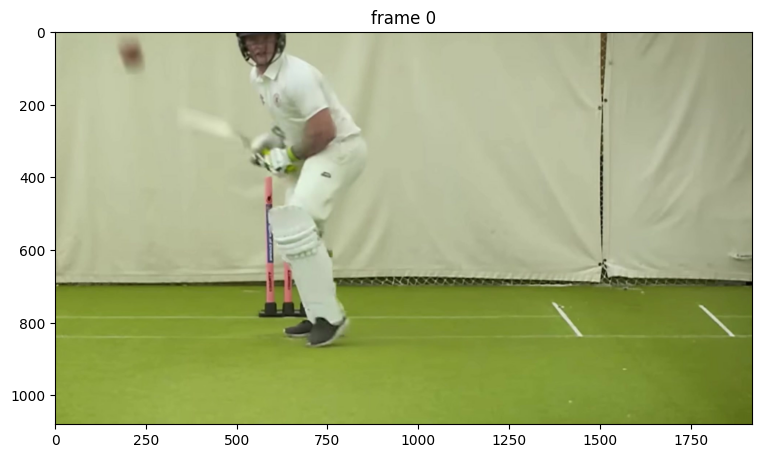

In [ ]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./video_frame_metrics_notOut"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

## Detect the Ball

Center of the detected ball in left half: (210, 66)


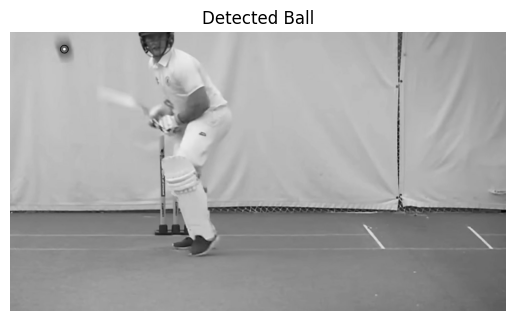

In [ ]:
# Load image and template
template_path = "redballtemplate.png"
image = cv2.imread(os.path.join(video_dir, frame_names[frame_idx]), cv2.IMREAD_GRAYSCALE)
template = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)

# Crop the left half of the image
height, width = image.shape
left_half = image[:, :width // 3]  # Retain only the left half

# Parameters for multi-scale matching
scales = [0.5, 0.75, 1.0, 1.25, 1.5]  # Adjust scales as needed
best_match = None
best_value = -1
best_location = None
best_template_size = None

# Multi-scale template matching on the left half
for scale in scales:
    resized_template = cv2.resize(template, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    result = cv2.matchTemplate(left_half, resized_template, cv2.TM_CCOEFF_NORMED)
    _, max_val, _, max_loc = cv2.minMaxLoc(result)

    if max_val > best_value:
        best_value = max_val
        best_match = resized_template
        best_location = max_loc
        best_template_size = resized_template.shape[::-1]  # (width, height)

# Calculate center of best match
template_width, template_height = best_template_size
center_x = best_location[0] + template_width // 2
center_y = best_location[1] + template_height // 2
center = (center_x, center_y)

# Adjust center to original image coordinates
center_adjusted = (center_x, center_y)

# Output
print("Center of the detected ball in left half:", center_adjusted)


# Draw a circle on the image
cv2.circle(image, center_adjusted, 5, (255, 0, 0), -1)
cv2.circle(image, center_adjusted, 15, (0, 255, 0), 2)
# Convert the image from BGR (OpenCV default) to RGB for Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image in JupyterLab
plt.imshow(image_rgb)
plt.title("Detected Ball")
plt.axis('off')  # Hide axes for cleaner display
plt.show()

In [ ]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 55/55 [00:02<00:00, 18.75it/s]


In [ ]:
predictor.reset_state(inference_state)

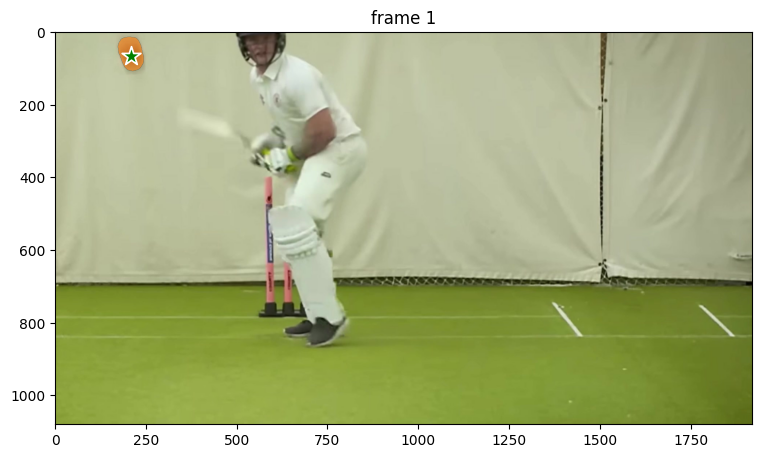

In [ ]:
ann_frame_idx = 1  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[center_x, center_y]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

### Detecting throughout the video

propagate in video: 100%|██████████| 54/54 [00:19<00:00,  2.83it/s]


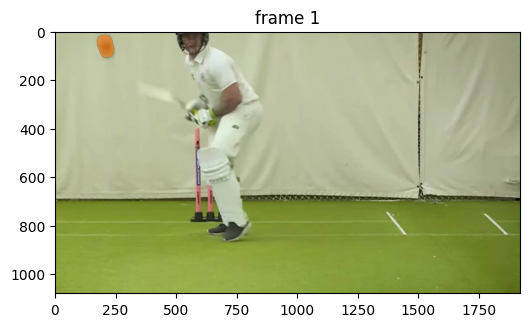

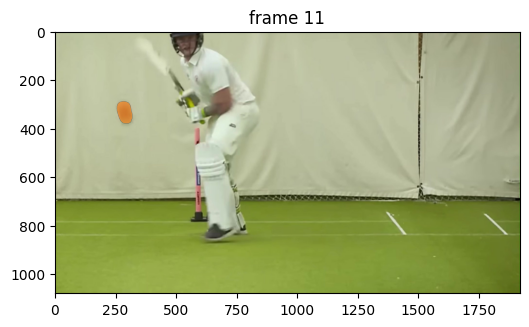

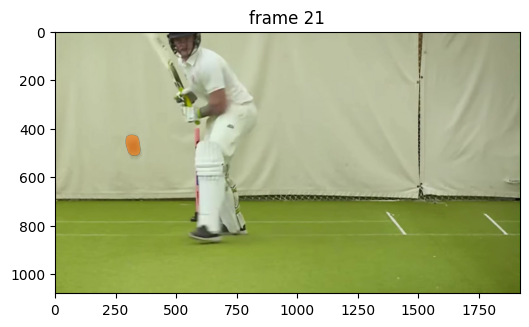

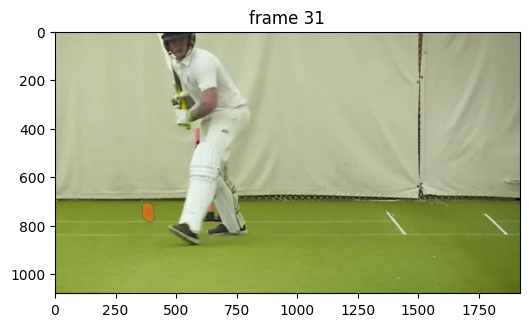

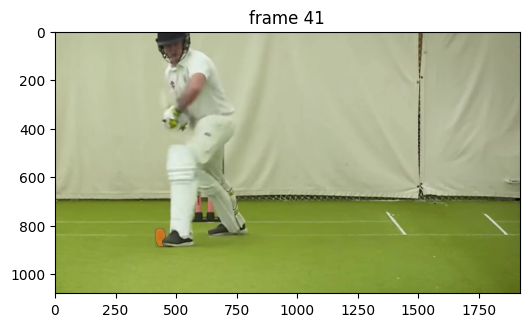

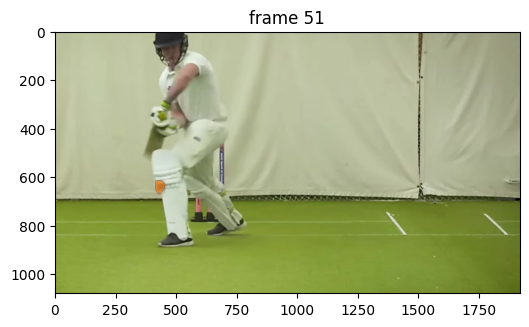

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(1, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

### Creating a video

In [ ]:
# Define output video parameters
output_video_path = "segmented_video_with_path_lbw6.mp4"
frame_width, frame_height = Image.open(os.path.join(video_dir, frame_names[0])).size
fps = 10  # Adjust based on the frame rate of your input video

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

ball_positions = []

# Iterate through all frames and write the segmented frames to the video
for out_frame_idx in range(len(frame_names)):

    frame = Image.open(os.path.join(video_dir, frame_names[out_frame_idx]))
    frame = np.array(frame)


    if len(frame.shape) < 2:
        raise ValueError(f"Frame {out_frame_idx} has an invalid shape: {frame.shape}")

    overlay = np.zeros_like(frame, dtype=np.uint8)

    if out_frame_idx in video_segments:
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            out_mask = np.squeeze(out_mask)

            if out_mask.ndim != 2:
                raise ValueError(f"Mask for frame {out_frame_idx}, object {out_obj_id} has an invalid shape after squeeze: {out_mask.shape}")

            mask = (out_mask > 0).astype(np.uint8)
            if mask.shape[:2] != frame.shape[:2]:
                print(f"Resizing mask from {mask.shape[:2]} to {frame.shape[:2]}")
                mask = cv2.resize(mask, (frame.shape[1], frame.shape[0]), interpolation=cv2.INTER_NEAREST)

            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                largest_contour = max(contours, key=cv2.contourArea)
                M = cv2.moments(largest_contour)
                if M["m00"] != 0:
                    center_x = int(M["m10"] / M["m00"])
                    center_y = int(M["m01"] / M["m00"])
                    ball_positions.append((center_x, center_y))

            color = np.random.randint(0, 255, (3,), dtype=np.uint8)
            for c in range(3):
                overlay[:, :, c] = np.where(mask > 0, color[c], overlay[:, :, c])

    combined_frame = cv2.addWeighted(frame, 0.7, overlay, 0.3, 0)

    for i in range(1, len(ball_positions)):
        cv2.line(
            combined_frame,
            ball_positions[i - 1],
            ball_positions[i],
            (0, 255, 0),
            thickness=2,
        )


    combined_frame_bgr = cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR)


    video_writer.write(combined_frame_bgr)

video_writer.release()

print(f"Segmented video with ball path saved at {output_video_path}")

Segmented video with ball path saved at segmented_video_with_path_lbw6.mp4


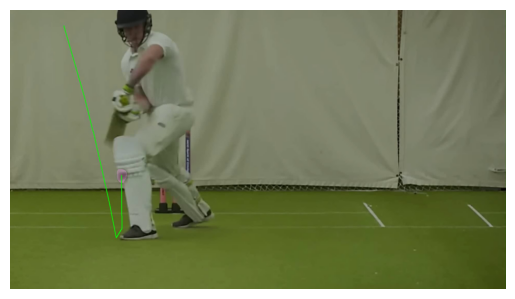

In [ ]:
from IPython.display import clear_output
import time

video_path = "segmented_video_with_path_lbw6.mp4"

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Cannot open video file.")
else:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


        import matplotlib.pyplot as plt
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show()


        time.sleep(1 / 30)
        clear_output(wait=True)

# Release the video capture object
cap.release()

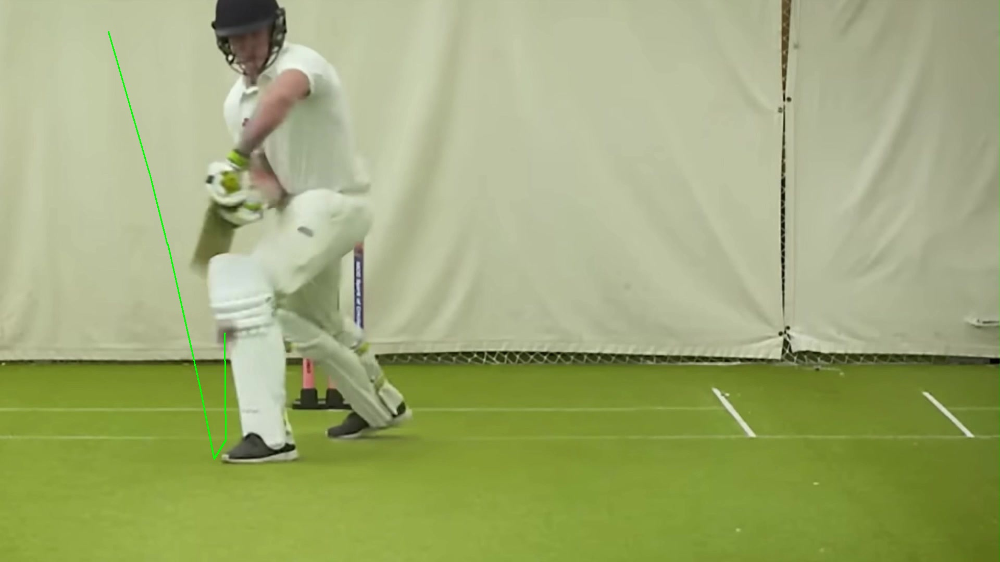

In [ ]:
# Path to the empty pitch image
empty_pitch_path = "video_frame_metrics_notOut/00055.jpg"

# Load the empty pitch image
empty_pitch = cv2.imread(empty_pitch_path)
if empty_pitch is None:
    raise FileNotFoundError(f"Could not load the empty pitch image at {empty_pitch_path}")

# Resize the empty pitch image to match the video frame dimensions
empty_pitch_resized = cv2.resize(empty_pitch, (frame_width, frame_height))

# Draw the ball trace on the empty pitch
for i in range(1, len(ball_positions)):
    cv2.line(
        empty_pitch_resized,
        ball_positions[i - 1],
        ball_positions[i],
        (0, 255, 0),  # Green color for the trace
        thickness=2,
    )

# Save the new image with the trace
output_image_path = "trace6.jpg"
cv2.imwrite(output_image_path, empty_pitch_resized)

# Display the result in the notebook
from IPython.display import Image as IPImage, display
display(IPImage(output_image_path))


In [ ]:
# Known parameters
pitch_length_meters = 22 * 0.9144  # Convert 22 yards to meters
frame_rate = 120  # Frames per second (adjust to your video's FPS)

# Ensure ball_positions has sufficient data
if len(ball_positions) < 2:
    raise ValueError("Not enough ball positions tracked to calculate speed.")

# Total time based on the number of frames
total_time_seconds = len(ball_positions) / frame_rate

# Calculate speed in m/s
speed_mps = pitch_length_meters / total_time_seconds

# Convert speed to km/h
speed_kmh = speed_mps * 3.6

# Print the result
print(f"Calculated Speed: {speed_kmh:.2f} km/h")

Calculated Speed: 160.93 km/h


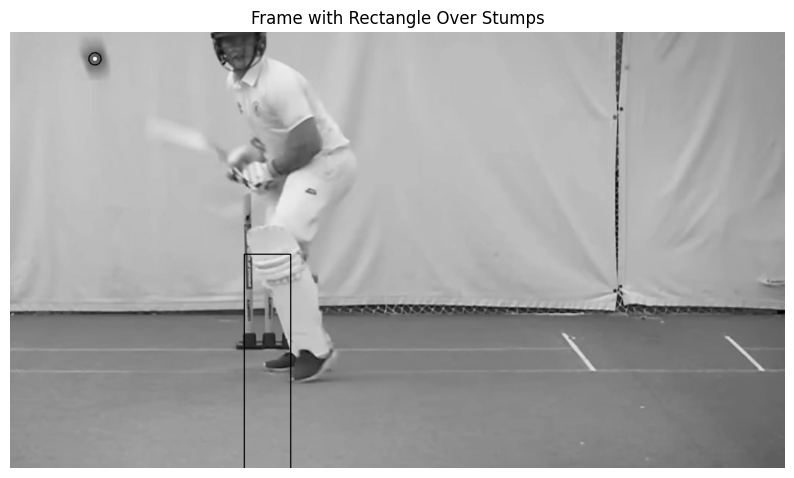

Frame with stump rectangle saved to frame_with_stump_rectangle.jpg


In [ ]:
# Define coordinates for the rectangle (adjust based on visual inspection)
# Coordinates should be in the format (top-left corner, bottom-right corner)
stump_rectangle = ((580, 550), (695, 1100))  # Example coordinates; adjust for accuracy

# Draw the rectangle on the image
stump_overlay = image.copy()
cv2.rectangle(stump_overlay, stump_rectangle[0], stump_rectangle[1], (0, 255, 0), 2)  # Green rectangle with thickness 2

# Convert to RGB for Matplotlib
stump_overlay_rgb = cv2.cvtColor(stump_overlay, cv2.COLOR_BGR2RGB)

# Display the image with the rectangle overlay
plt.figure(figsize=(10, 6))
plt.imshow(stump_overlay_rgb)
plt.title("Frame with Rectangle Over Stumps")
plt.axis('off')
plt.show()

# Save the image if needed
output_path = "frame_with_stump_rectangle.jpg"
cv2.imwrite(output_path, stump_overlay)
print(f"Frame with stump rectangle saved to {output_path}")

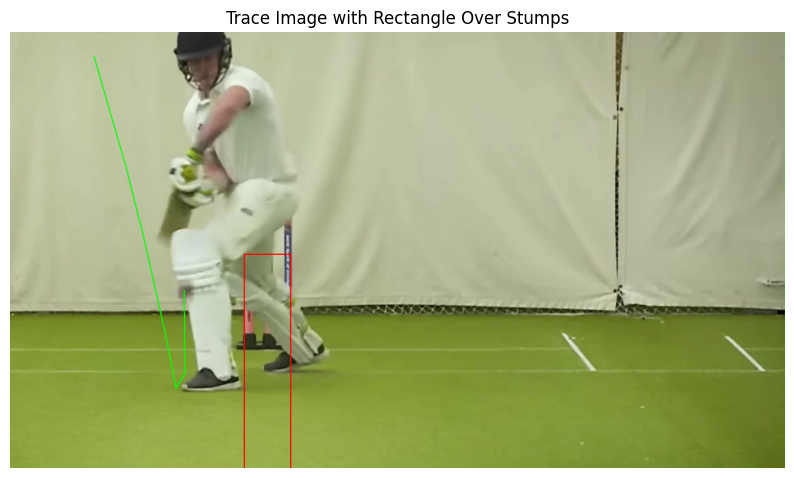

Trace image with stump rectangle saved to trace_with_stump_rectangle.jpg


In [ ]:
# Load the trace image
trace_image_path = "trace6.jpg"  # Update this path to your trace image
trace_image = cv2.imread(trace_image_path)

# Ensure the trace image is loaded correctly
if trace_image is None:
    raise FileNotFoundError("The trace image could not be loaded. Please provide the correct path.")

# Define coordinates for the rectangle (adjust based on visual inspection)
# Coordinates should be in the format (top-left corner, bottom-right corner)
stump_rectangle = ((580, 550), (695, 1100))  # Example coordinates; adjust for accuracy

# Draw the rectangle on the trace image
stump_overlay_trace = trace_image.copy()
cv2.rectangle(stump_overlay_trace, stump_rectangle[0], stump_rectangle[1], (0, 0, 255), 2)  # Green rectangle with thickness 2

# Convert to RGB for Matplotlib
stump_overlay_trace_rgb = cv2.cvtColor(stump_overlay_trace, cv2.COLOR_BGR2RGB)

# Display the trace image with the rectangle overlay
plt.figure(figsize=(10, 6))
plt.imshow(stump_overlay_trace_rgb)
plt.title("Trace Image with Rectangle Over Stumps")
plt.axis('off')
plt.show()

# Save the updated trace image with the rectangle overlay
output_path_trace = "trace_with_stump_rectangle.jpg"
cv2.imwrite(output_path_trace, stump_overlay_trace)
print(f"Trace image with stump rectangle saved to {output_path_trace}")


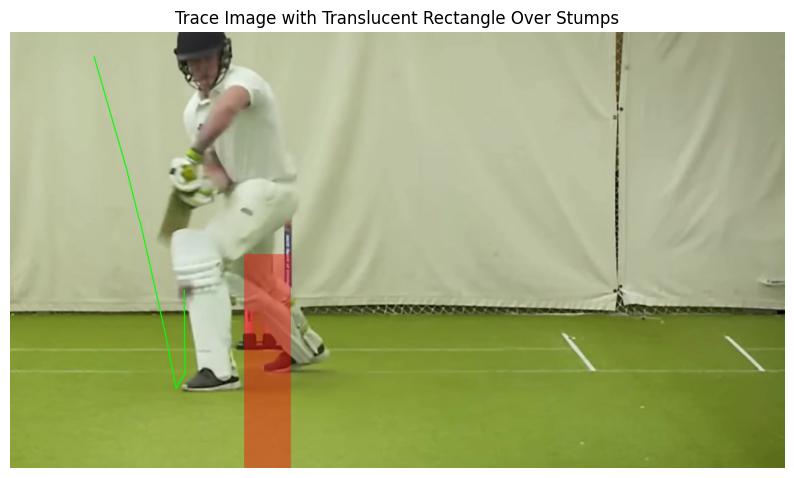

Trace image with translucent stump rectangle saved to trace_with_translucent_rectangle.jpg


In [ ]:
# Load the trace image
trace_image_path = "trace6.jpg"  # Update this path to your trace image
trace_image = cv2.imread(trace_image_path)

# Ensure the trace image is loaded correctly
if trace_image is None:
    raise FileNotFoundError("The trace image could not be loaded. Please provide the correct path.")

# Define coordinates for the rectangle (adjust based on visual inspection)
# Coordinates should be in the format (top-left corner, bottom-right corner)
stump_rectangle = ((580, 550), (695, 1100))  # Example coordinates; adjust for accuracy

# Create an overlay for the rectangle
overlay = trace_image.copy()

# Draw the rectangle on the overlay
cv2.rectangle(overlay, stump_rectangle[0], stump_rectangle[1], (0, 0, 255), -1)  # Solid rectangle (red)

# Blend the overlay with the original image to make it translucent
alpha = 0.4  # Transparency factor
stump_overlay_trace = cv2.addWeighted(overlay, alpha, trace_image, 1 - alpha, 0)

# Convert to RGB for Matplotlib
stump_overlay_trace_rgb = cv2.cvtColor(stump_overlay_trace, cv2.COLOR_BGR2RGB)

# Display the trace image with the translucent rectangle
plt.figure(figsize=(10, 6))
plt.imshow(stump_overlay_trace_rgb)
plt.title("Trace Image with Translucent Rectangle Over Stumps")
plt.axis('off')
plt.show()

# Save the updated trace image with the translucent rectangle
output_path_trace = "trace_with_translucent_rectangle.jpg"
cv2.imwrite(output_path_trace, stump_overlay_trace)
print(f"Trace image with translucent stump rectangle saved to {output_path_trace}")


Last ball position: (431, 640)
Decision: NOT OUT


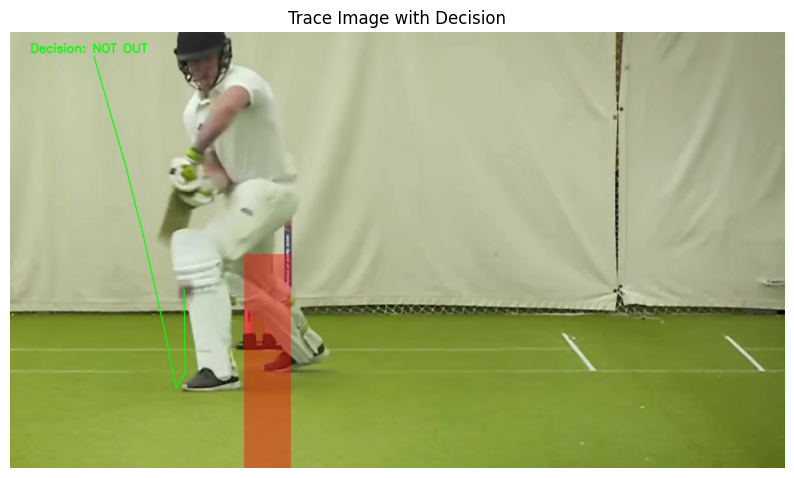

Trace image with decision saved to trace_with_decision.jpg


In [ ]:
# Assuming `ball_positions` contains the (x, y) positions of the ball in each frame
# Ensure `ball_positions` is available
if len(ball_positions) == 0:
    raise ValueError("No ball positions tracked. Ensure `ball_positions` is populated.")

# Get the last known position of the ball
last_ball_position = ball_positions[-1]  # (x, y)

# Define the rectangle boundaries
x1, y1 = stump_rectangle[0]  # Top-left corner
x2, y2 = stump_rectangle[1]  # Bottom-right corner

# Check if the last ball position is inside the rectangle
if x1 <= last_ball_position[0] <= x2 and y1 <= last_ball_position[1] <= y2:
    decision = "OUT"
else:
    decision = "NOT OUT"

# Print the decision
print(f"Last ball position: {last_ball_position}")
print(f"Decision: {decision}")

# Overlay the decision on the image
output_image = stump_overlay_trace.copy()  # Use the image with the translucent rectangle
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 255, 0) if decision == "NOT OUT" else (0, 0, 255)  # Green for NOT OUT, Red for OUT
thickness = 2

cv2.putText(
    output_image,
    f"Decision: {decision}",
    (50, 50),  # Position of text
    font,
    font_scale,
    color,
    thickness,
    cv2.LINE_AA,
)

# Convert to RGB for Matplotlib
output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

# Display the image with the decision
plt.figure(figsize=(10, 6))
plt.imshow(output_image_rgb)
plt.title("Trace Image with Decision")
plt.axis('off')
plt.show()

# Save the updated image with the decision
output_path_decision = "trace_with_decision.jpg"
cv2.imwrite(output_path_decision, output_image)
print(f"Trace image with decision saved to {output_path_decision}")


### Calculating metrics

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# Rendering loop for visualization (every 15th frame)
plt.close("all")
available_frame_indices = list(video_segments.keys())

propagate in video: 100%|██████████| 54/54 [00:19<00:00,  2.83it/s]


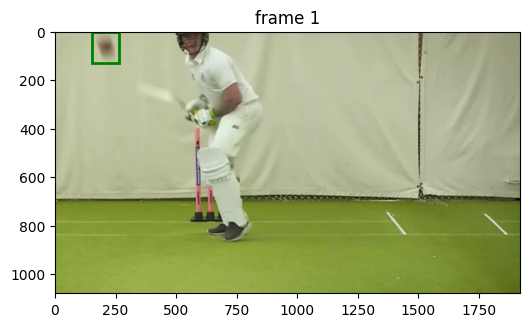

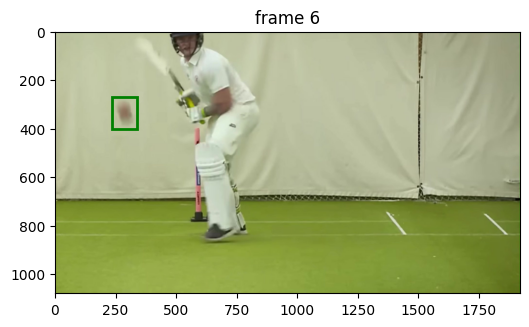

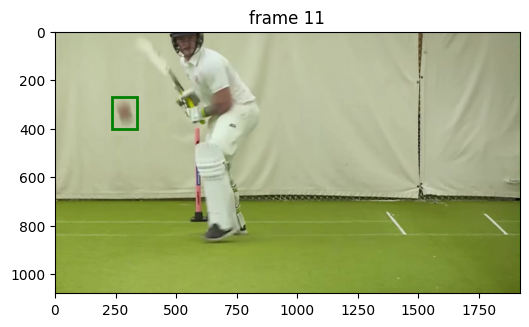

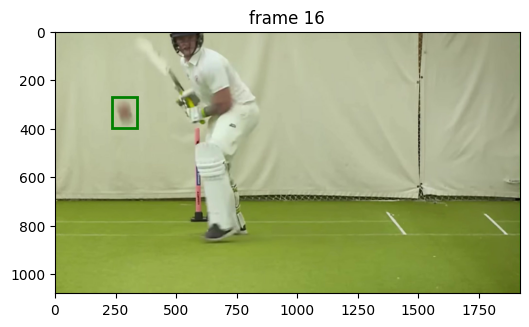

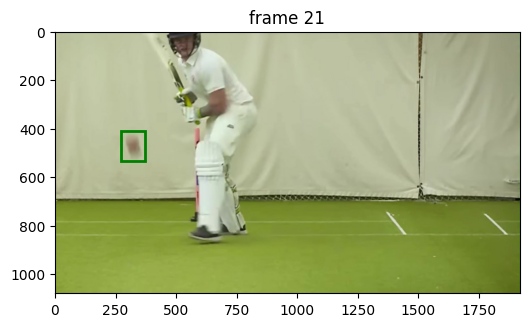

...

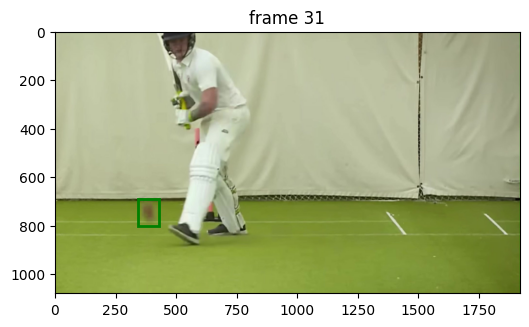

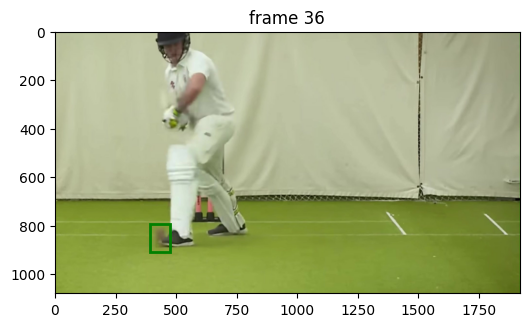

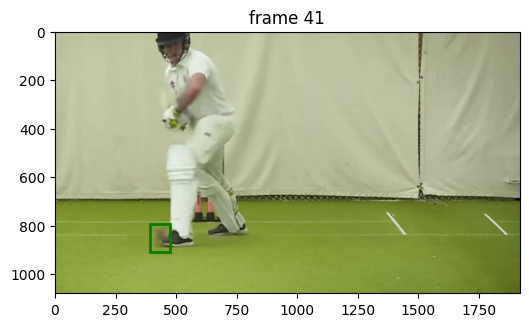

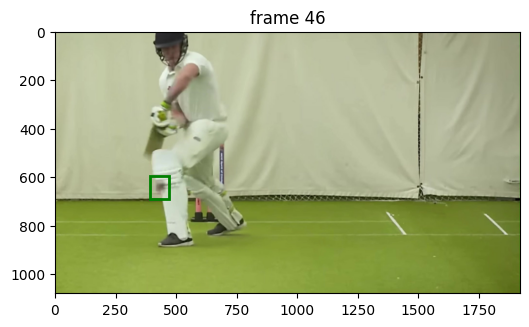

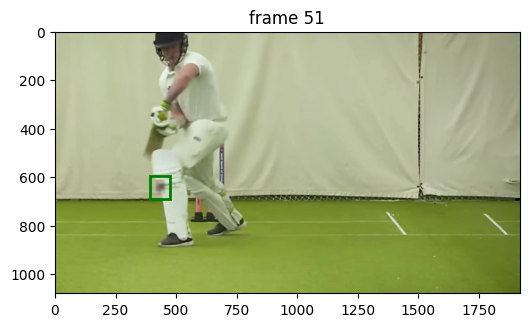

In [ ]:
# Rendering loop for visualization (every 5th frame)
plt.close("all")
available_frame_indices = list(video_segments.keys())

start_frame = 1  # Start from the first frame (index 0)
end_frame = 54  # Last frame index (55 frames in total, 0-54)
vis_frame_stride = 5

margin = 20  # Increase this value as needed

for out_frame_idx in range(start_frame, end_frame + 1, vis_frame_stride):
    # Load the current frame with PIL for visualization
    frame_path = os.path.join(video_dir, frame_names[out_frame_idx])
    pil_frame = Image.open(frame_path)
    width, height = pil_frame.size  # PIL gives (width, height)

    # Render the frame with segmentation
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(pil_frame)

    # Check if the frame index exists in `video_segments`
    if out_frame_idx in available_frame_indices:
        # For each object mask in the current frame
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            # Ensure the mask is 2D
            if out_mask.ndim > 2:
                out_mask = out_mask.squeeze()  # Remove extra dimensions

            # Calculate bounding box from the mask
            y_indices, x_indices = np.where(out_mask > 0)  # Get non-zero mask indices

            # Skip if the mask is empty
            if len(y_indices) == 0 or len(x_indices) == 0:
                continue

            x_min, x_max = x_indices.min(), x_indices.max()
            y_min, y_max = y_indices.min(), y_indices.max()

            # Apply margin and ensure coordinates stay within image bounds
            x_min = max(x_min - margin, 0)
            y_min = max(y_min - margin, 0)
            x_max = min(x_max + margin, width - 1)
            y_max = min(y_max + margin, height - 1)

            # Show bounding box on the visualization
            box = [x_min, y_min, x_max, y_max]
            show_box(box, plt.gca())

    plt.show()


In [ ]:
# Parameters
margin = 20  # If you want a margin around your bounding box, adjust as needed

# Get frame height, width (assuming all frames have the same size)
first_frame_path = os.path.join(video_dir, frame_names[0])
first_frame = cv2.imread(first_frame_path)
frame_height, frame_width, _ = first_frame.shape

# Data structure to hold all bounding box info
bbox_info = []

# Iterate through frames from 0 to the last frame, stepping by 10
for frame_idx in range(1, len(frame_names), 5):
    # Check if this frame has segmentation results
    if frame_idx not in video_segments:
        continue

    # Process each object in the given frame
    for out_obj_id, out_mask in video_segments[frame_idx].items():
        # Ensure mask is 2D
        if out_mask.ndim > 2:
            out_mask = out_mask.squeeze()

        # Get non-zero mask indices
        y_indices, x_indices = np.where(out_mask > 0)

        # Skip if mask is empty
        if len(y_indices) == 0 or len(x_indices) == 0:
            continue

        # Compute bounding box
        x_min, x_max = x_indices.min(), x_indices.max()
        y_min, y_max = y_indices.min(), y_indices.max()

        # Apply margin and clamp to frame boundaries
        x_min = max(x_min - margin, 0)
        y_min = max(y_min - margin, 0)
        x_max = min(x_max + margin, frame_width - 1)
        y_max = min(y_max + margin, frame_height - 1)

        # Store the result
        bbox_info.append({
            "frame_idx": frame_idx,
            "object_id": out_obj_id,
            "x_min": x_min,
            "y_min": y_min,
            "x_max": x_max,
            "y_max": y_max
        })

# Now print the results
for info in bbox_info:
    print(f"Frame: {info['frame_idx']}, Object: {info['object_id']}, "
          f"BBox: ({info['x_min']}, {info['y_min']}), ({info['x_max']}, {info['y_max']})")


Frame: 1, Object: 1, BBox: (153, 0), (263, 129)
Frame: 6, Object: 1, BBox: (235, 269), (339, 401)
Frame: 11, Object: 1, BBox: (235, 269), (338, 400)
Frame: 16, Object: 1, BBox: (236, 270), (338, 399)
Frame: 21, Object: 1, BBox: (272, 408), (372, 533)
Frame: 26, Object: 1, BBox: (341, 689), (428, 803)
Frame: 31, Object: 1, BBox: (341, 689), (428, 803)
Frame: 36, Object: 1, BBox: (394, 792), (474, 908)
Frame: 41, Object: 1, BBox: (394, 793), (475, 908)
Frame: 46, Object: 1, BBox: (394, 596), (472, 689)
Frame: 51, Object: 1, BBox: (394, 596), (473, 689)


In [ ]:
import json

json_path = "result_notOut_metrics.json"  # replace with the actual path to your JSON file
with open(json_path, "r") as f:
    data = json.load(f)

# Create a mapping from image_id to file_name (optional if you want to reference filenames)
image_id_to_filename = {img["id"]: img["file_name"] for img in data["images"]}

# Iterate over annotations
for ann in data["annotations"]:
    image_id = ann["image_id"]
    bbox = ann["bbox"]  # [x, y, width, height]

    # Convert [x, y, width, height] to [x_min, y_min, x_max, y_max]
    x_min = bbox[0]
    y_min = bbox[1]
    x_max = bbox[0] + bbox[2]
    y_max = bbox[1] + bbox[3]

    # Since the original code processed frames every 10 frames,
    # multiply image_id by 10 to match that indexing
    frame_id = image_id * 5 + 1

    # Print in a similar format
    print(f"Frame: {frame_id}, BBox: ({x_min}, {y_min}), ({x_max}, {y_max})")


Frame: 1, BBox: (163.0188679245283, 7.409948542024014), (257.4957118353344, 118.55917667238421)
Frame: 6, BBox: (237.1183533447684, 270.46312178387643), (331.59519725557453, 389.02229845626067)
Frame: 11, BBox: (237.1183533447684, 272.31560891938256), (337.1526586620925, 392.7272727272728)
Frame: 16, BBox: (233.4133790737564, 274.1680960548885), (326.0377358490566, 385.3173241852488)
Frame: 21, BBox: (277.87307032590047, 413.10463121783874), (363.08747855917665, 520.548885077187)
Frame: 26, BBox: (340.85763293310464, 700.2401372212693), (414.95711835334475, 794.7169811320755)
Frame: 31, BBox: (348.2675814751286, 702.0926243567753), (418.6620926243568, 783.6020583190395)
Frame: 36, BBox: (372.3499142367067, 826.2092624356775), (442.74442538593473, 933.6535162950256)
Frame: 41, BBox: (383.46483704974264, 794.7169811320755), (474.2367066895368, 900.3087478559177)
Frame: 46, BBox: (398.2847341337907, 598.3533447684391), (468.67924528301876, 683.5677530017152)
Frame: 51, BBox: (392.72727272

In [ ]:
##########################
# Prepare Ground Truth Data
##########################

# frame_id = image_id * 10 to align with your predicted indexing
gt_bboxes = {}  # {frame_id: [ (x_min, y_min, x_max, y_max), ... ]}
for ann in data["annotations"]:
    image_id = ann["image_id"]
    x, y, w, h = ann["bbox"]
    x_min, y_min, x_max, y_max = x, y, x + w, y + h
    frame_id = image_id * 10
    if frame_id not in gt_bboxes:
        gt_bboxes[frame_id] = []
    gt_bboxes[frame_id].append((x_min, y_min, x_max, y_max))

In [ ]:
##########################
# Prepare Predicted Data
##########################

pred_bboxes = {}  # {frame_id: [ (x_min, y_min, x_max, y_max), ... ]}
for info in bbox_info:
    frame_id = info["frame_idx"]
    box = (info["x_min"], info["y_min"], info["x_max"], info["y_max"])
    if frame_id not in pred_bboxes:
        pred_bboxes[frame_id] = []
    pred_bboxes[frame_id].append(box)

In [ ]:
print(pred_bboxes)

{1: [(153, 0, 263, 129)], 6: [(235, 269, 339, 401)], 11: [(235, 269, 338, 400)], 16: [(236, 270, 338, 399)], 21: [(272, 408, 372, 533)], 26: [(341, 689, 428, 803)], 31: [(341, 689, 428, 803)], 36: [(394, 792, 474, 908)], 41: [(394, 793, 475, 908)], 46: [(394, 596, 472, 689)], 51: [(394, 596, 473, 689)]}


In [ ]:
print(gt_bboxes)

{0: [(163.0188679245283, 7.409948542024014, 257.4957118353344, 118.55917667238421)], 10: [(237.1183533447684, 270.46312178387643, 331.59519725557453, 389.02229845626067)], 20: [(237.1183533447684, 272.31560891938256, 337.1526586620925, 392.7272727272728)], 30: [(233.4133790737564, 274.1680960548885, 326.0377358490566, 385.3173241852488)], 40: [(277.87307032590047, 413.10463121783874, 363.08747855917665, 520.548885077187)], 50: [(340.85763293310464, 700.2401372212693, 414.95711835334475, 794.7169811320755)], 60: [(348.2675814751286, 702.0926243567753, 418.6620926243568, 783.6020583190395)], 70: [(372.3499142367067, 826.2092624356775, 442.74442538593473, 933.6535162950256)], 80: [(383.46483704974264, 794.7169811320755, 474.2367066895368, 900.3087478559177)], 90: [(398.2847341337907, 598.3533447684391, 468.67924528301876, 683.5677530017152)], 100: [(392.72727272727275, 603.9108061749571, 466.82675814751286, 689.1252144082333)]}


In [ ]:
# Adjust `gt_bboxes` to align with `pred_bboxes`
aligned_gt_bboxes = {}
for frame_id, bboxes in gt_bboxes.items():
    # Convert frame_id from gt_bboxes to match pred_bboxes
    aligned_frame_id = (frame_id // 10) * 5 + 1
    aligned_gt_bboxes[aligned_frame_id] = bboxes

# Adjust `pred_bboxes` if necessary (in this case, no changes are needed)
aligned_pred_bboxes = pred_bboxes

# Print the aligned dictionaries for verification
print("Aligned Ground Truth BBoxes:")
print(aligned_gt_bboxes)

print("\nAligned Predicted BBoxes:")
print(aligned_pred_bboxes)

Aligned Ground Truth BBoxes:
{1: [(163.0188679245283, 7.409948542024014, 257.4957118353344, 118.55917667238421)], 6: [(237.1183533447684, 270.46312178387643, 331.59519725557453, 389.02229845626067)], 11: [(237.1183533447684, 272.31560891938256, 337.1526586620925, 392.7272727272728)], 16: [(233.4133790737564, 274.1680960548885, 326.0377358490566, 385.3173241852488)], 21: [(277.87307032590047, 413.10463121783874, 363.08747855917665, 520.548885077187)], 26: [(340.85763293310464, 700.2401372212693, 414.95711835334475, 794.7169811320755)], 31: [(348.2675814751286, 702.0926243567753, 418.6620926243568, 783.6020583190395)], 36: [(372.3499142367067, 826.2092624356775, 442.74442538593473, 933.6535162950256)], 41: [(383.46483704974264, 794.7169811320755, 474.2367066895368, 900.3087478559177)], 46: [(398.2847341337907, 598.3533447684391, 468.67924528301876, 683.5677530017152)], 51: [(392.72727272727275, 603.9108061749571, 466.82675814751286, 689.1252144082333)]}

Aligned Predicted BBoxes:
{1: [(1

In [ ]:
##########################
# Compute TP, FP, FN
##########################

iou_threshold = 0.4
TP = 0
FP = 0
FN = 0

all_frames = set(aligned_gt_bboxes.keys()).union(set(aligned_pred_bboxes.keys()))

for frame_id in sorted(all_frames):
    gt_boxes = aligned_gt_bboxes.get(frame_id, [])
    pr_boxes = aligned_pred_bboxes.get(frame_id, [])

    matched_preds = set()

    for gt_box in gt_boxes:
        # Find the best IoU match from pr_boxes
        best_iou = 0
        best_pred_idx = -1
        for i, pr_box in enumerate(pr_boxes):
            if i in matched_preds:
                continue
            current_iou = iou(gt_box, pr_box)
            if current_iou > best_iou:
                best_iou = current_iou
                best_pred_idx = i

        if best_iou >= iou_threshold:
            TP += 1
            matched_preds.add(best_pred_idx)
        else:
            FN += 1

    FP += (len(pr_boxes) - len(matched_preds))

precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0.0

print("Evaluation Results:")
print(f"TP: {TP}, FP: {FP}, FN: {FN}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


Evaluation Results:
TP: 10, FP: 1, FN: 1
Precision: 0.9091
Recall: 0.9091


In [ ]:
##########################
# Mean IoU of Matched Boxes
##########################

matched_ious = []

for frame_id in sorted(all_frames):
    gt_boxes = aligned_gt_bboxes.get(frame_id, [])
    pr_boxes = aligned_pred_bboxes.get(frame_id, [])
    matched_preds = set()

    for gt_box in gt_boxes:
        best_iou = 0
        best_pred_idx = -1
        for i, pr_box in enumerate(pr_boxes):
            if i in matched_preds:
                continue
            current_iou = iou(gt_box, pr_box)
            if current_iou > best_iou:
                best_iou = current_iou
                best_pred_idx = i
        if best_iou >= iou_threshold:
            matched_ious.append(best_iou)
            matched_preds.add(best_pred_idx)

mean_iou = np.mean(matched_ious) if len(matched_ious) > 0 else 0.0
print(f"Mean IoU: {mean_iou:.4f}")

Mean IoU: 0.7697


In [ ]:
pred_positions = {}
# Suppose you have one predicted ball position per processed frame_idx (every 10 frames),
# and ball_positions[i] corresponds to frame_id = i*10 (for example):
for i, pos in enumerate(ball_positions):
    frame_id = i   # adjust this if needed based on how you stored ball_positions
    pred_positions[frame_id] = pos

In [ ]:
# ---------------------------------------------------------------------
# Compute Ground Truth Ball Positions from Bounding Boxes
# We assume gt_bboxes[frame_id] is a list of ground truth boxes for that frame_id.
# We pick the first (or only) box if only one ball is tracked.
gt_positions = {}
for frame_id, boxes in aligned_gt_bboxes.items():
    # Assuming one ball box per frame
    # Compute centroid of the ground truth box
    # box format: (x_min, y_min, x_max, y_max)
    for box in boxes:
        x_min, y_min, x_max, y_max = box
        cx = (x_min + x_max) / 2.0
        cy = (y_min + y_max) / 2.0
        gt_positions[frame_id] = (cx, cy)
        break  # If there's only one ball per frame, break after first

In [ ]:
aligned_pred_positions = {}
for frame_id in aligned_gt_bboxes.keys():
    # frame_id is already in multiples of 10
    # Check if we have a predicted position for this frame
    if frame_id in pred_positions:
        aligned_pred_positions[frame_id] = pred_positions[frame_id]

In [ ]:
# ---------------------------------------------------------------------
# Compute Tracking Accuracy
# We'll compute the average Euclidean distance between predicted and ground truth positions
distances = []
for frame_id in gt_positions:
    if frame_id in pred_positions:
        gt_pos = gt_positions[frame_id]
        pred_pos = pred_positions[frame_id]
        # Euclidean distance
        dist = math.sqrt((gt_pos[0] - pred_pos[0])**2 + (gt_pos[1] - pred_pos[1])**2)
        distances.append(dist)

In [ ]:
if len(distances) > 0:
    avg_distance = np.mean(distances)
    print(f"Tracking Accuracy (Average Position Error): {avg_distance:.2f} pixels")
else:
    print("No overlapping frames to compute tracking accuracy.")

Tracking Accuracy (Average Position Error): 20.27 pixels


In [ ]:
print(gt_positions)

{1: (210.25728987993136, 62.98456260720411), 6: (284.3567753001715, 329.7427101200685), 11: (287.13550600343046, 332.5214408233277), 16: (279.72555746140654, 329.74271012006864), 21: (320.48027444253853, 466.8267581475129), 26: (377.90737564322467, 747.4785591766724), 31: (383.4648370497427, 742.8473413379074), 36: (407.5471698113207, 879.9313893653516), 41: (428.85077186963974, 847.5128644939966), 46: (433.48198970840474, 640.9605488850772), 51: (429.77701543739283, 646.5180102915951)}


In [ ]:
print(aligned_pred_positions)

{1: (209, 61), 6: (287, 334), 11: (287, 334), 16: (287, 333), 21: (322, 469), 26: (384, 745), 31: (411, 882), 36: (433, 847), 41: (433, 847), 46: (431, 640), 51: (431, 640)}


In [ ]:
# Interpolate ground truth positions
interpolated_gt_positions = interpolate_positions(gt_positions, total_frames)

# Interpolate predicted positions
interpolated_pred_positions = interpolate_positions(aligned_pred_positions, total_frames)

In [ ]:
##########################
# Tracking Accuracy: Average Position Error
##########################
distances = []
for frame_id in sorted(interpolated_gt_positions.keys()):
    if frame_id in interpolated_pred_positions:
        gt_pos = interpolated_gt_positions[frame_id]
        pred_pos = interpolated_pred_positions[frame_id]
        # Euclidean distance
        dist = math.sqrt((gt_pos[0] - pred_pos[0]) ** 2 + (gt_pos[1] - pred_pos[1]) ** 2)
        distances.append(dist)

if len(distances) > 0:
    avg_distance = np.mean(distances)
    print(f"Tracking Accuracy (Average Position Error): {avg_distance:.2f} pixels")
else:
    print("No overlapping frames to compute tracking accuracy.")

Tracking Accuracy (Average Position Error): 18.52 pixels


In [ ]:
##########################
# Trajectory Smoothness: Average Acceleration Magnitude
##########################
# Extract predicted positions in order of frame_id
sorted_frames = sorted(interpolated_pred_positions.keys())
positions_in_order = [interpolated_pred_positions[f] for f in sorted_frames]

In [ ]:
# Compute velocities
velocities = []
time_interval = 1  # Assume 1-frame intervals unless adjusted for your data
for i in range(len(positions_in_order) - 1):
    x1, y1 = positions_in_order[i]
    x2, y2 = positions_in_order[i + 1]
    vx = (x2 - x1) / time_interval
    vy = (y2 - y1) / time_interval
    velocities.append((vx, vy))

# Compute accelerations
accelerations = []
for i in range(len(velocities) - 1):
    vx1, vy1 = velocities[i]
    vx2, vy2 = velocities[i + 1]
    ax = (vx2 - vx1) / time_interval
    ay = (vy2 - vy1) / time_interval
    accelerations.append((ax, ay))


In [ ]:
# Measure smoothness as average magnitude of acceleration
acc_magnitudes = [math.sqrt(ax * ax + ay * ay) for ax, ay in accelerations]
if len(acc_magnitudes) > 0:
    avg_acc = np.mean(acc_magnitudes)
    print(f"Trajectory Smoothness (Avg Acceleration Magnitude): {avg_acc:.2f} pixels/frame^2")
else:
    print("Not enough frames to compute trajectory smoothness (need at least 3 positions).")

Trajectory Smoothness (Avg Acceleration Magnitude): 5.47 pixels/frame^2
